# Product Segmentation - Experiment & Model Selection

**Context:** Before predicting individual customer behavior, it is crucial to decode the product landscape. In this first part of the assignment, we explore the Vibrent product catalog using state-of-the-art multimodal embeddings (Voyage AI). 

**Goal of this Notebook:** This notebook focuses purely on the Data Science and Engineering aspects. We conduct various experiments to find the most robust and semantically meaningful segmentation strategy. The final chosen model will then be deployed in the second notebook for business analysis.

# Imports

In [26]:
import pandas as pd
import numpy as np

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
import hdbscan

from sklearn.metrics import silhouette_score
from sklearn.metrics import adjusted_rand_score


import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

import os
import sys
from pathlib import Path

# Add src/ to path (once, so imports work)
sys.path.append(str(Path().resolve().parent / "src"))

# Enable autoreload for Jupyter notebooks
%load_ext autoreload
%autoreload 2

from paths import DATA_DATASETS, DATA_EMBEDDINGS, DATA_IMAGES
from helper_functions import verify_cluster_labels, apply_umap, plot_2d_projection

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load Data

In [5]:
outfits = pd.read_csv(DATA_DATASETS / "outfits.csv", sep=";")
embeddings = pd.read_csv(DATA_EMBEDDINGS / "embeddings_voyage_multimodal.csv", sep=";")
transactions = pd.read_csv(DATA_DATASETS / "transactions.csv", sep=";")

# Join outfits with embeddings
data = outfits.merge(embeddings, left_on="id", right_on="outfit_id")

# Extract embedding features
embedding_cols = [col for col in data.columns if col.startswith("dim_")]
X = data[embedding_cols].values

In [3]:
print(np.min(X))
print(np.max(X))

-0.109375
0.125


Scaling/normalizing vectors did not improve performance --> vectors are already normalized 

Compute a 2D UMAP embedding of the high-dimensional feature matrix X for visualization.
The embedding is calculated once and reused to avoid repeated expensive computations.

In [6]:
X_2d = apply_umap(embedding_matrix = X, n_components=2)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


# Case 1: 2048 dimensions

The following two subsections are commented out, because it takes quite a long time to run those (2048 dimensions) and they perform quite poorly compared to the tested methodological approaches.

## DBSCAN

In [5]:
# clusterer = hdbscan.HDBSCAN(min_cluster_size=30, metric='euclidean')
# labels = clusterer.fit_predict(X)

In [6]:
# np.unique(labels)

In [7]:
# noise_ratio = np.mean(labels == -1)
# print("Noise ratio:", noise_ratio)

In [8]:
# pd.Series(labels).value_counts()

Super dominant cluster (ca. 84%) and 4 relatively small clusters. Noise is fine.

In [9]:
# clusterer_200 = hdbscan.HDBSCAN(min_cluster_size=200, metric='euclidean')
# labels_200 = clusterer_200.fit_predict(X)

In [10]:
# np.unique(labels_200)

# noise_ratio = np.mean(labels_200 == -1)
# print("Noise ratio:", noise_ratio)

# pd.Series(labels_200).value_counts()

**Results/Interpretation:** 

HDBSCAN clustering results in 1 big cluster with multiple small clusters and in another trial in mainly noise. This hints at products being semantically relatively similar with just a few strongly divergent styles, which is not uncommon in fashion catalogs. Since HDBSCAN works with density based clustering this could be the reason why it does not work effectively on the fashion embeddings.

## K-Means

Elbow method to get optimal amount of clusters:

In [11]:
# inertia = []
# K_range = range(2, 20)

# for k in K_range:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     kmeans.fit(X)
#     inertia.append(kmeans.inertia_)

# plt.plot(K_range, inertia)
# plt.xlabel("Number of Clusters")
# plt.ylabel("Inertia")
# plt.title("Elbow Method")
# plt.show()

In [12]:
# scores = []

# for k in K_range:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     labels = kmeans.fit_predict(X)
#     score = silhouette_score(X, labels)
#     scores.append(score)

# plt.plot(K_range, scores)
# plt.xlabel("Number of Clusters")
# plt.ylabel("Silhouette Score")
# plt.show()

In [13]:
# print("Best K (Elbow):", K_range[np.argmin(inertia)])
# print("Best K (Silhouette):", K_range[np.argmax(scores)])

Use 6 clusters for KMeans 

In [14]:
# kmeans = KMeans(n_clusters=6, random_state=42)
# data["cluster"] = kmeans.fit_predict(X)

In [15]:
# cluster_summary = data.groupby("cluster")["retailPrice"].mean().sort_values()
# print(cluster_summary)

In [16]:
# data["cluster"].value_counts()

In [17]:
# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X)

# plt.figure(figsize=(8,6))
# sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=data["cluster"], palette="tab10")
# plt.title("Product Clusters (PCA Projection)")
# plt.show()

In [18]:
# merged = transactions.merge(data[["id", "cluster"]], 
#                             left_on="outfit.id", 
#                             right_on="id")

# cluster_revenue = merged.groupby("cluster").size().sort_values(ascending = False)
# print(cluster_revenue)

# Case 2: Dimension reduction with UMAP

Dimension reduction with UMAP to 20 dimensions to confirm that 2048 dimensions is too much to form robust clusters (Curse of dimensionality) with the K-Means algorithm. 

Initilize reducer 

In [7]:
X_reduced = apply_umap(embedding_matrix = X, n_components=20)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## UMAP + KMEANS

In [ ]:
results = []

for k in range(2, 20):
    kmeans = KMeans(n_clusters = k, random_state = 42)
    labels = kmeans.fit_predict(X_reduced)

    sil_score = silhouette_score(X_reduced, labels)

    cluster_sizes = pd.Series(labels).value_counts().sort_index()
    imbalance = cluster_sizes.std() / cluster_sizes.mean() # relative imbalance - higher means more imbalanced cluster sizes
    results.append({
        "k": k,
        "silhouette": sil_score,
        "min_cluster_size": cluster_sizes.min(),
        "max_cluster_size": cluster_sizes.max(),
        "imbalance": imbalance
    })

results_df = pd.DataFrame(results)
print(results_df)

     k  silhouette  min_cluster_size  max_cluster_size  imbalance
0    2    0.547607              6630              9019   0.215896
1    3    0.573244               421              8598   0.818173
2    4    0.523904               421              6630   0.687849
3    5    0.553352               323              6630   0.886355
4    6    0.600752               323              6630   0.943307
5    7    0.608660                59              6630   1.090329
6    8    0.644516               323              6623   1.021762
7    9    0.452690               323              3622   0.631229
8   10    0.463004                59              3615   0.740607
9   11    0.465627                59              2564   0.602465
10  12    0.467662                59              2564   0.679283
11  13    0.481700                59              2437   0.712222
12  14    0.484444                15              2437   0.788691
13  15    0.484788                15              2437   0.859708
14  16    

A comprehensive cluster scan revealed a clear global silhouette maximum at K = 8. Beyond K = 8, cluster cohesion dropped substantially and micro-clusters emerged, indicating over-segmentation. At k = 8 the smallest cluster size is still at 323. A size that can still be interpreted and used for further analysis. A size of 59 makes generalizability harder.

Therefore, K = 8 was selected as the optimal balance between semantic seperation and managerial interpretability. 

Check cluster stability

In [21]:
for k in range(5, 15):
    aris = []
    for seed in range(100):
        k1 = KMeans(n_clusters=k, random_state=seed).fit(X_reduced)
        k2 = KMeans(n_clusters=k, random_state=seed+100).fit(X_reduced)

        aris.append(adjusted_rand_score(k1.labels_, k2.labels_))

    print(f"Mean ARI for k={k}:", np.mean(aris))

Mean ARI for k=5: 0.8303206865127523
Mean ARI for k=6: 0.8429372563388118
Mean ARI for k=7: 0.82670500071154
Mean ARI for k=8: 0.8496461643282803
Mean ARI for k=9: 0.8326283723169056
Mean ARI for k=10: 0.8511884563415141
Mean ARI for k=11: 0.8269938904292318
Mean ARI for k=12: 0.8385050122080073
Mean ARI for k=13: 0.8314285804668212
Mean ARI for k=14: 0.8267042286090707


Cluster robustness was evaluated across multiple random initializations for mutiple different cluster numbers. The mean Adjusted Rand Index (ARI) of 0.85 indicates strong structural stability for k = 8. Therefore, the 8-cluster solution is both well-separated and reproducible.

In [58]:
k = 8

kmeans = KMeans(n_clusters=k, random_state=42)

data_umap_kmeans = data.copy()
data_umap_kmeans["cluster"] = kmeans.fit_predict(X_reduced)

In [23]:
data_umap_kmeans["cluster"].value_counts()

cluster
2    6623
1    2168
7    1911
3    1704
5    1409
6    1090
0     421
4     323
Name: count, dtype: int64

In [59]:
cluster_names = {   0: "Iconic Arm Candy", 
                    1: "Blouses & Shirts", 
                    2: "Dress", 
                    3: "Nordic Comfort", 
                    4: "Golden Hour Details", 
                    5: "Trousers", 
                    6: "Skirts", 
                    7: "Jackets & Coats" }

data_umap_kmeans["cluster_name"] = data_umap_kmeans["cluster"].map(cluster_names)

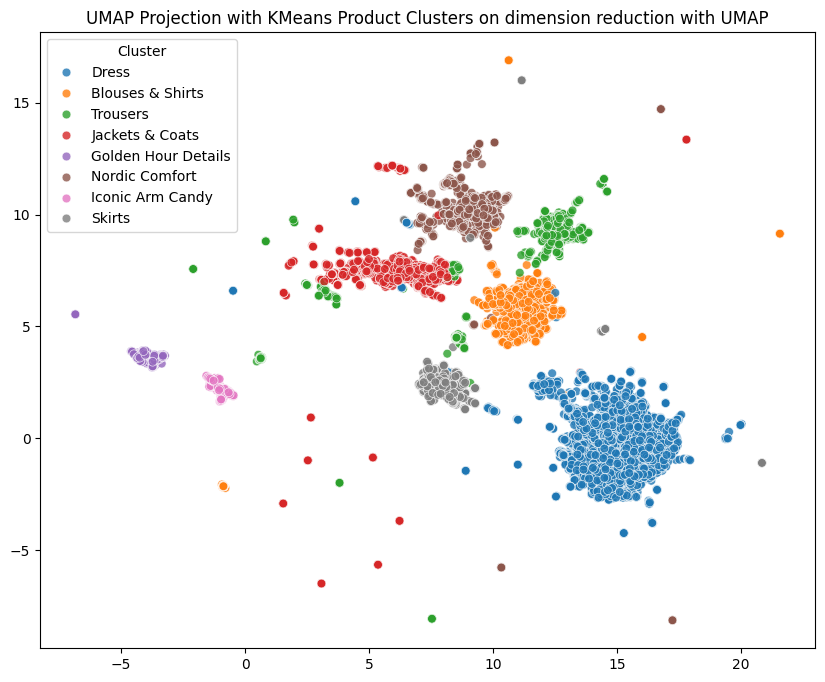

In [60]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_umap_kmeans["cluster_name"], 
                   title = "UMAP Projection with KMeans Product Clusters on dimension reduction with UMAP")

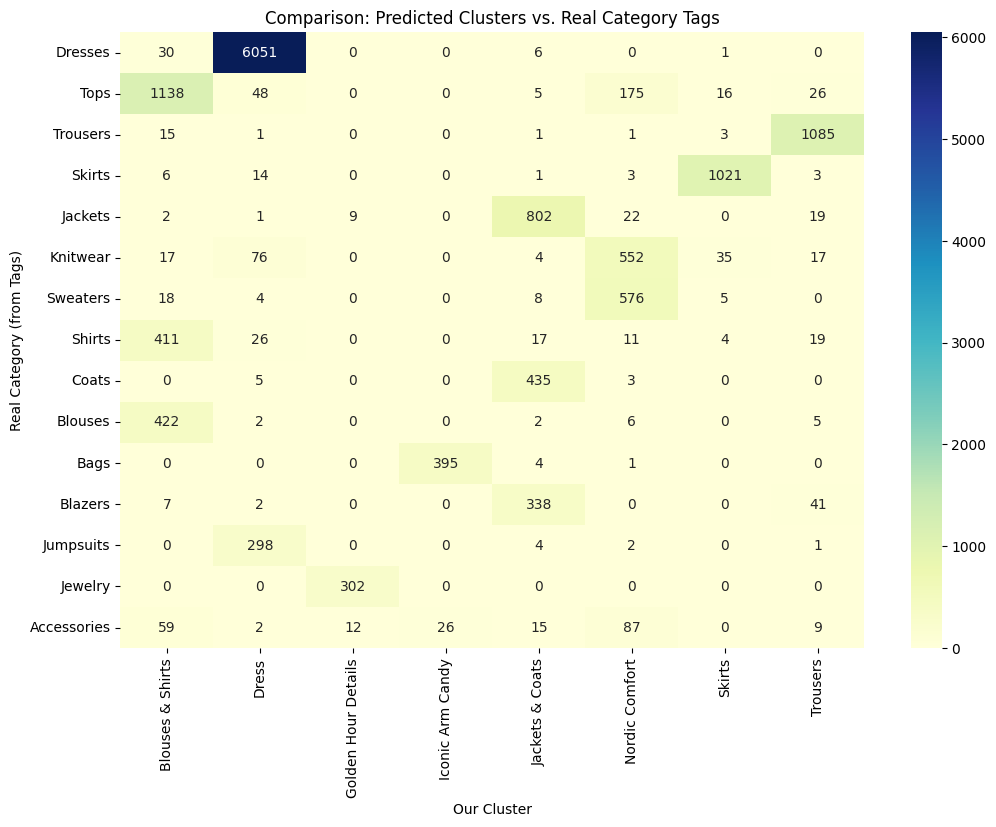

In [63]:
# Extract main category (everything before the first comma)
data_umap_kmeans["main_category"] = data_umap_kmeans["Category"].astype(str).str.split(",").str[0].str.strip()

y_axis = "main_category"
x_axis = "cluster_name"

contingency_table = pd.crosstab(data_umap_kmeans[y_axis], data_umap_kmeans[x_axis])

# Use top 15 categories for better visualization - otherwise too many categories make the heatmap unreadable
top_categories = data_umap_kmeans["main_category"].value_counts().head(15).index
contingency_table = contingency_table.loc[top_categories]

# Visualising with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap="YlGnBu")
plt.title("Comparison: Predicted Clusters vs. Real Category Tags")
plt.ylabel("Real Category (from Tags)")
plt.xlabel("Our Cluster")
plt.yticks(rotation=0)
plt.show()

### Experimenting with UMAP dimensions

In [30]:
# Define the target dimensions we want to test
dimensions_to_test = [2, 5, 10, 20, 30, 50]
k_values = range(5, 13)  # K values to test for stability

results = []

for dim in dimensions_to_test:
    # Reduce original embeddings (X) to 'dim' dimensions
    X_reduced_temp = apply_umap(embedding_matrix = X, n_components = dim)
    
    for k in k_values:
        # Apply K-Means (using our optimal k=8) on the reduced space
        kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init="auto")
        labels_temp = kmeans_temp.fit_predict(X_reduced_temp)

        # Calculate how well-separated the clusters are in this dimension
        score = silhouette_score(X_reduced_temp, labels_temp)
        
        # Save the result dictionary
        results.append({
            "UMAP Dimensions": dim,
            "Number of Clusters (k)": k,
            "Silhouette Score": score
        })

results_df = pd.DataFrame(results)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_stat

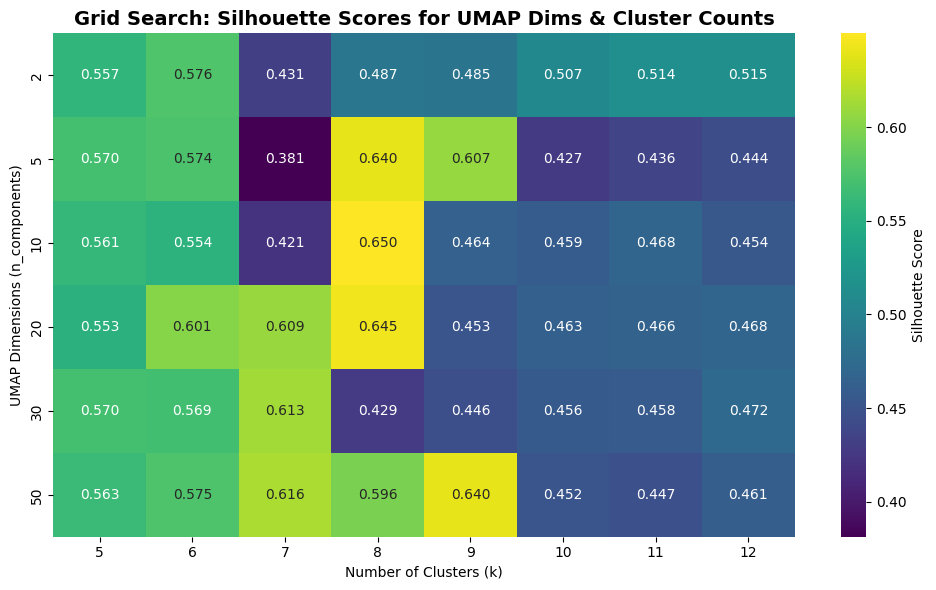

In [31]:
# Pivot the table to create a 2D grid for the heatmap
heatmap_data = results_df.pivot(
    index="UMAP Dimensions", 
    columns="Number of Clusters (k)", 
    values="Silhouette Score"
)

# Create the Heatmap plot
plt.figure(figsize=(10, 6))
sns.heatmap(
    heatmap_data, 
    annot=True,        # Show the actual score numbers in the boxes
    cmap="viridis",    # Color palette (dark/purple is low, yellow is high)
    fmt=".3f",         # Format numbers to 3 decimal places
    cbar_kws={'label': 'Silhouette Score'}
)

plt.title("Grid Search: Silhouette Scores for UMAP Dims & Cluster Counts", fontsize=14, fontweight='bold')
plt.ylabel("UMAP Dimensions (n_components)")
plt.xlabel("Number of Clusters (k)")
plt.tight_layout()
plt.show()

### Check Results

#### k = 9 & UMAP = 50

In [32]:
X_reduced_50 = apply_umap(embedding_matrix = X, n_components = 50)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [42]:
k = 9

kmeans = KMeans(n_clusters=k, random_state=42)

data_umap_50_kmeans = data.copy()
data_umap_50_kmeans["cluster"] = kmeans.fit_predict(X_reduced)

In [43]:
data_umap_50_kmeans["cluster"].value_counts()

cluster
8    3622
2    3008
1    2161
7    1911
3    1704
5    1409
6    1090
0     421
4     323
Name: count, dtype: int64

In [54]:
aris = []

for seed in range(100):
    k1 = KMeans(n_clusters=9, random_state=seed).fit(X_reduced)
    k2 = KMeans(n_clusters=9, random_state=seed+100).fit(X_reduced)

    aris.append(adjusted_rand_score(k1.labels_, k2.labels_))

print(f"Mean ARI for k={k}:", np.mean(aris))

Mean ARI for k=8: 0.8326283723169056


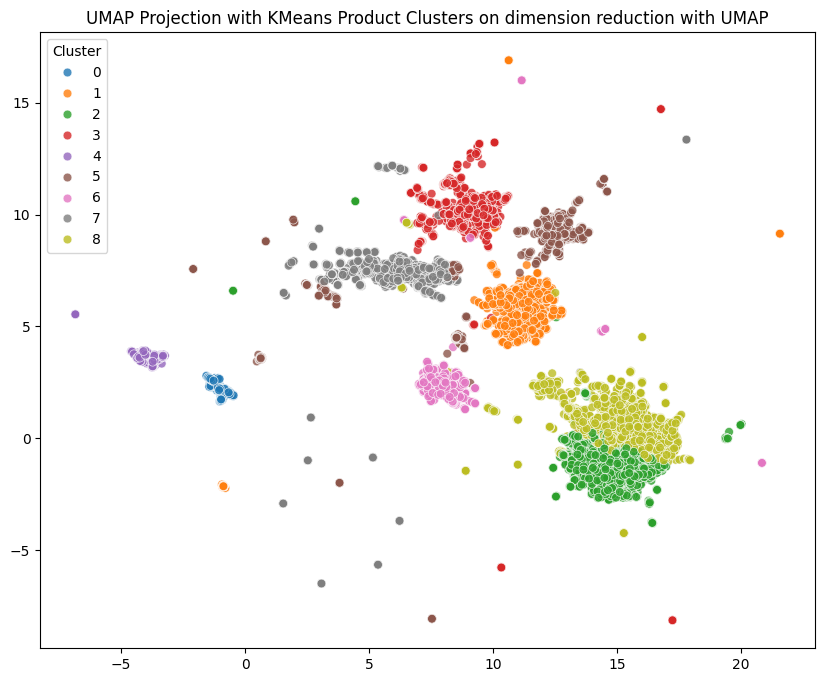

In [44]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_umap_50_kmeans["cluster"], 
                   title = "UMAP Projection with KMeans Product Clusters on dimension reduction with UMAP")

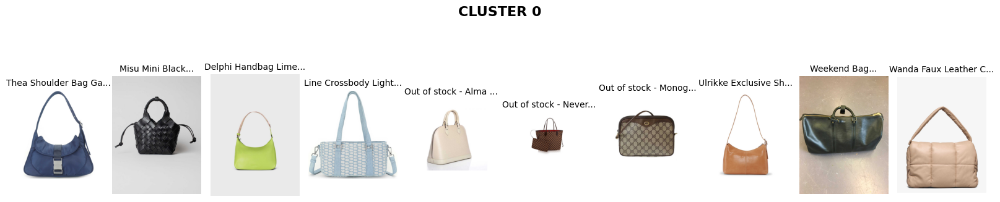

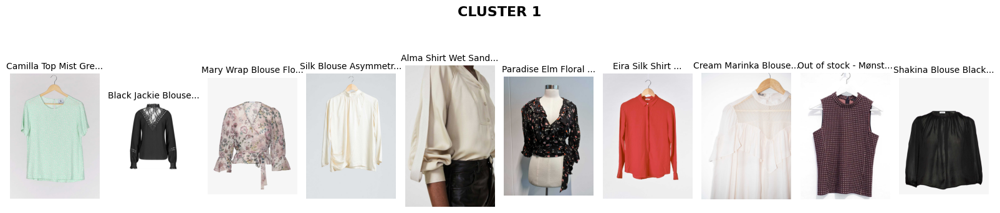

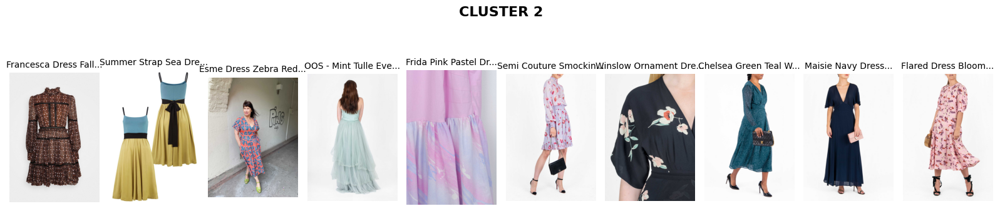

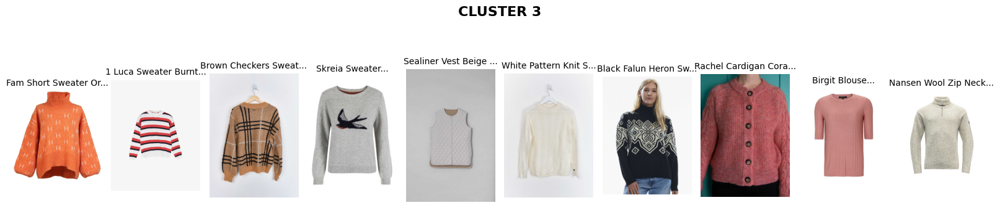

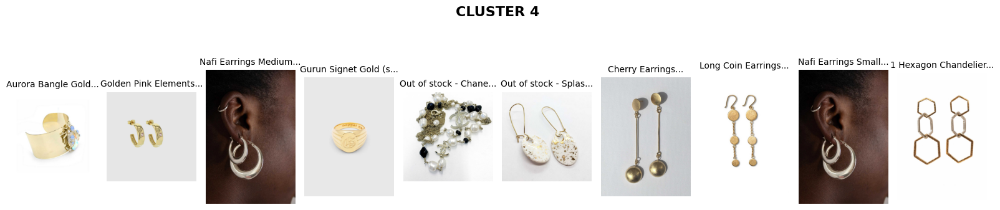

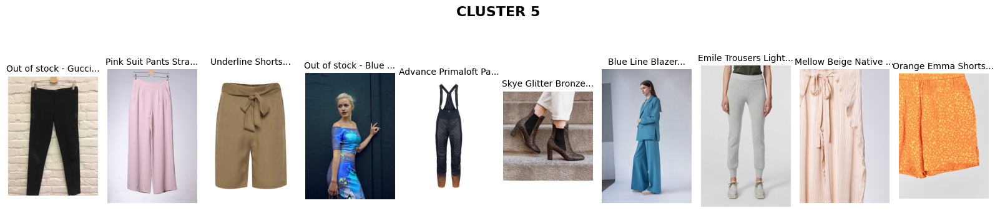

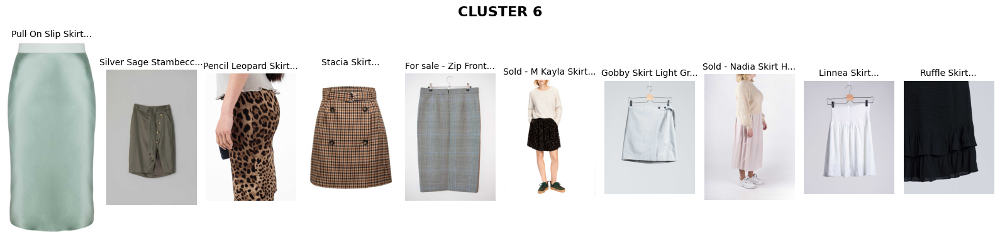

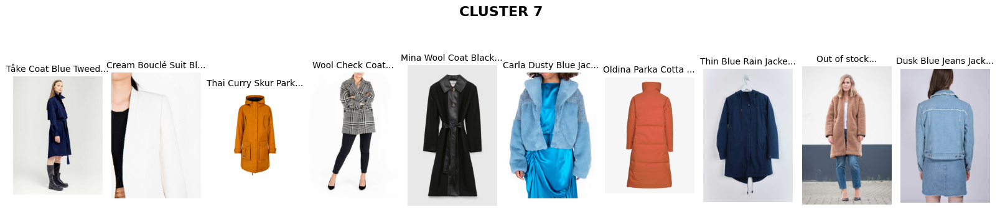

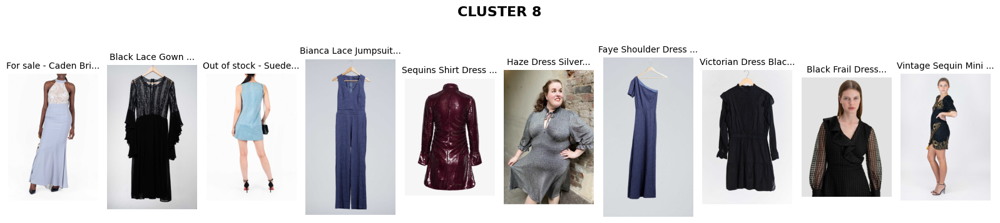

In [38]:
verify_cluster_labels(data_umap_50_kmeans, DATA_IMAGES, n_samples=10)

Splitting of big cluster in bottom left. Printing the pictures reveals both clusters include dresses. Even tough the ARI score is quite high it is slightly lower than the other approaches with 8 clusters instead of 9. Since we want to further analyse and use the clusters for predicting this clustering does not make to much sense for us.

#### k = 8 & UMAP = 10

In [46]:
X_reduced_10 = apply_umap(embedding_matrix = X, n_components = 10)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [47]:
k = 8

kmeans = KMeans(n_clusters=k, random_state=42)

data_umap_10_kmeans = data.copy()
data_umap_10_kmeans["cluster"] = kmeans.fit_predict(X_reduced_10)

In [48]:
data_umap_10_kmeans["cluster"].value_counts()

cluster
1    6630
5    2102
7    1929
2    1743
4    1369
6    1081
0     472
3     323
Name: count, dtype: int64

In [55]:
aris = []

for seed in range(100):
    k1 = KMeans(n_clusters=8, random_state=seed).fit(X_reduced)
    k2 = KMeans(n_clusters=8, random_state=seed+100).fit(X_reduced)

    aris.append(adjusted_rand_score(k1.labels_, k2.labels_))

print(f"Mean ARI for k={k}:", np.mean(aris))

Mean ARI for k=8: 0.8496461643282803


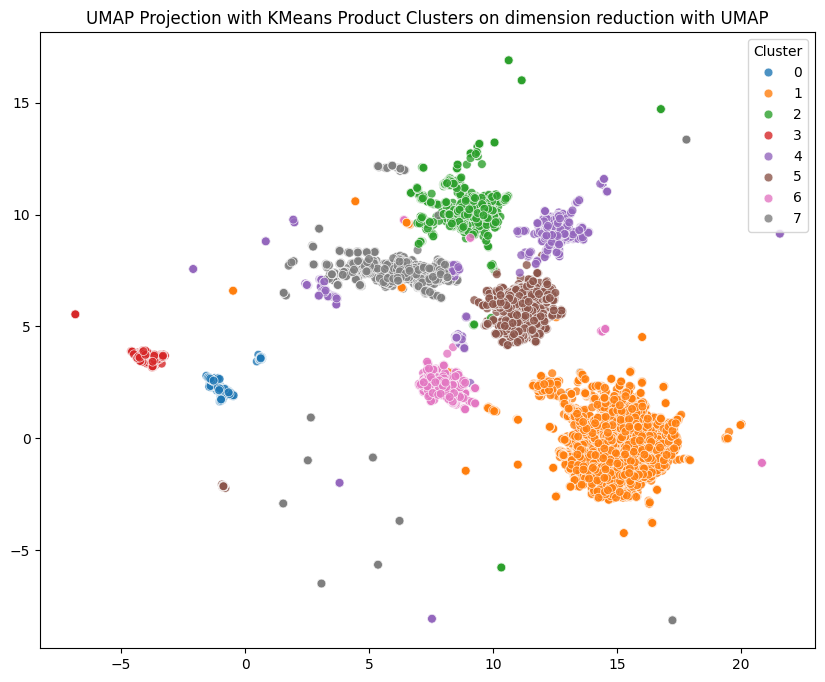

In [49]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_umap_10_kmeans["cluster"], 
                   title = "UMAP Projection with KMeans Product Clusters on dimension reduction with UMAP")

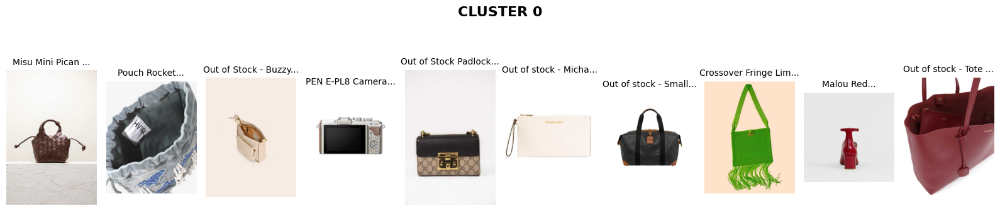

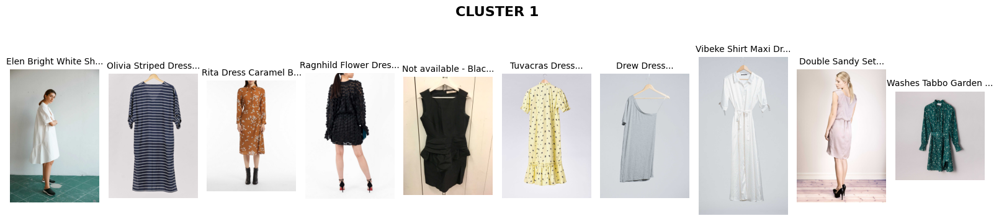

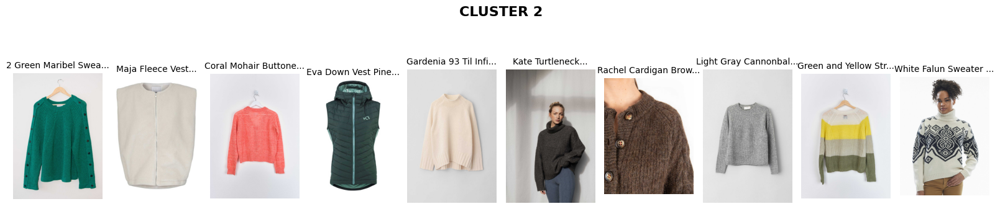

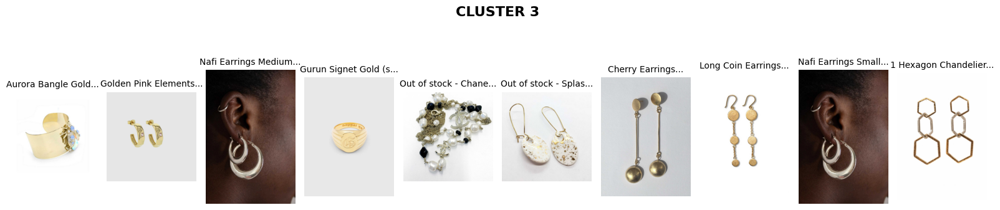

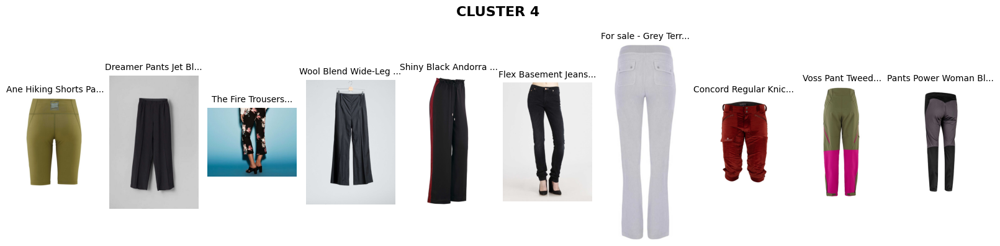

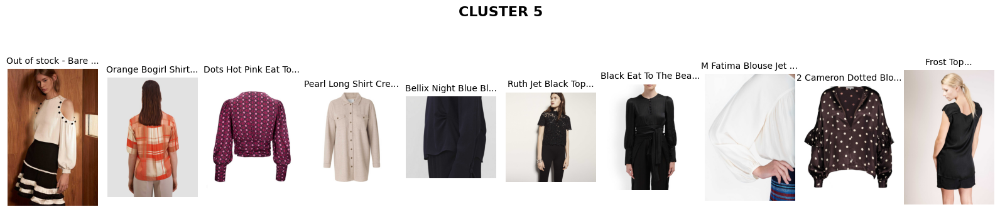

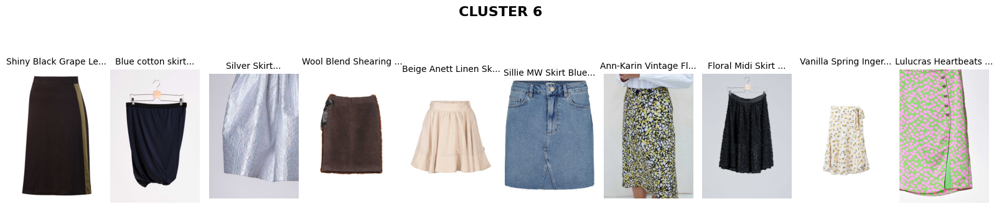

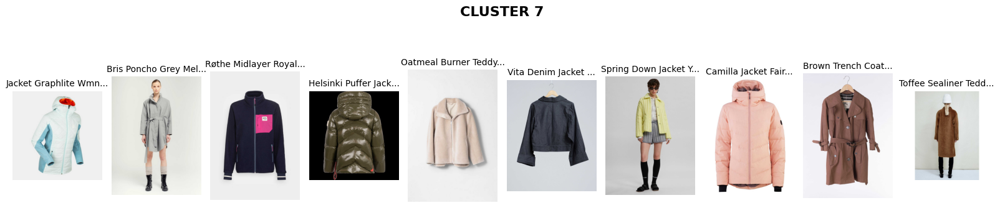

In [51]:
verify_cluster_labels(data_umap_10_kmeans, DATA_IMAGES, n_samples=10)

It seems like we get the same results like we did with k = 8 and UMAP = 20 (ARI scores are the same). To check if this is really the case we will use the ARI again to compare the two clusterings mathematically.

In [56]:
# 1. Create the UMAP=10 and UMAP=20 projections
print("Calculating UMAP for 10 and 20 dimensions...")
X_reduced_10 = apply_umap(embedding_matrix = X, n_components = 10)

X_reduced_20 = apply_umap(embedding_matrix = X, n_components = 20)

# 2. Fit K-Means (k=8) on both projections
print("Clustering both projections...")
kmeans_10 = KMeans(n_clusters=8, random_state=42, n_init="auto")
labels_10 = kmeans_10.fit_predict(X_reduced_10)

kmeans_20 = KMeans(n_clusters=8, random_state=42, n_init="auto")
labels_20 = kmeans_20.fit_predict(X_reduced_20)

# 3. Compare the two clusterings mathematically
# The Adjusted Rand Index (ARI) measures similarity between two assignments. 
# A score of 1.0 means they grouped the exact same items together.
ari_score = adjusted_rand_score(labels_10, labels_20)
print(f"\n---> Adjusted Rand Index (Similarity): {ari_score:.4f}")

# 4. Compare them visually using a cross-tabulation
# This matrix shows how items from the 10-dim clusters map to the 20-dim clusters
comparison_df = pd.DataFrame({
    'UMAP_10_Clusters': labels_10,
    'UMAP_20_Clusters': labels_20
})

crosstab = pd.crosstab(comparison_df['UMAP_10_Clusters'], comparison_df['UMAP_20_Clusters'])
print("\nCross-Tabulation (Confusion Matrix):")
print("Rows: UMAP=10 | Columns: UMAP=20")
print("-" * 40)
print(crosstab)

Calculating UMAP for 10 and 20 dimensions...


c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Clustering both projections...

---> Adjusted Rand Index (Similarity): 0.9874

Cross-Tabulation (Confusion Matrix):
Rows: UMAP=10 | Columns: UMAP=20
----------------------------------------
UMAP_20_Clusters    0     1     2     3    4     5     6     7
UMAP_10_Clusters                                              
0                 421     0     0     0    0    51     0     0
1                   0     8  6622     0    0     0     0     0
2                   0    45     0  1688    0     0    10     0
3                   0     0     0     0  323     0     0     0
4                   0    15     0     0    0  1343     0    11
5                   0  2100     1     0    0     1     0     0
6                   0     0     0     0    0     1  1080     0
7                   0     0     0    16    0    13     0  1900


Since the similarity of those two clusterings is 98,74% we can say that the clustering is really stable even "against" parameter changes.

## UMAP + GMM

In [ ]:
results = []

for k in range(2, 20):
    gmm = GaussianMixture(n_components = k, random_state = 42)
    labels = gmm.fit_predict(X_reduced)

    sil_score = silhouette_score(X_reduced, labels)

    cluster_sizes = pd.Series(labels).value_counts().sort_index()
    imbalance = cluster_sizes.std() / cluster_sizes.mean() # relative imbalance - higher means more imbalanced cluster sizes
    results.append({
        "k": k,
        "silhouette": sil_score,
        "min_cluster_size": cluster_sizes.min(),
        "max_cluster_size": cluster_sizes.max(),
        "imbalance": imbalance
    })

results_df = pd.DataFrame(results)
print(results_df)

     k  silhouette  min_cluster_size  max_cluster_size  imbalance
0    2    0.520283              6331              9318   0.269938
1    3    0.544159               421              8904   0.833655
2    4    0.523075               421              6623   0.686215
3    5    0.552469               323              6623   0.885054
4    6    0.600754               323              6623   0.944019
5    7    0.608675                59              6623   1.090990
6    8    0.644025               323              6623   1.022266
7    9    0.454145               323              5196   0.827414
8   10    0.454261                59              3382   0.736164
9   11    0.456986                59              3007   0.641618
10  12    0.458744                59              3007   0.717149
11  13    0.419593                59              4539   0.993851
12  14    0.422252                15              4538   1.065819
13  15    0.422554                15              4539   1.134648
14  16    

In [ ]:
gmm = GaussianMixture(n_components=8, covariance_type='full', random_state=42) # covariance_type='full' allows for clusters of different shapes and orientations

# Hard Clustering
gmm_labels = gmm.fit_predict(X_reduced)

data_umap_gmm = data.copy()
data_umap_gmm["cluster"] = gmm_labels

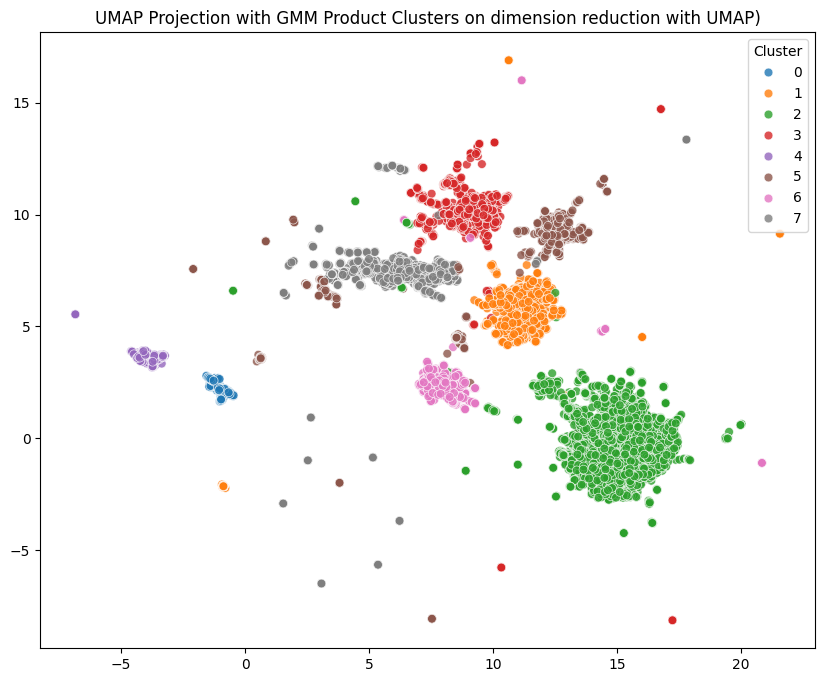

In [14]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_umap_gmm["cluster"], 
                   title = "UMAP Projection with GMM Product Clusters on dimension reduction with UMAP)")

Same results as with UMAP + KMeans!!!

**Try Soft Clustering**

In [ ]:
# Soft Clustering (similar to Machine Learning "probabilities" - we get a probability for each cluster, not just a hard assignment)
gmm_probabilities = gmm.predict_proba(X_reduced)

In [ ]:
# Beispiel für Soft Clustering ausgeben (wir schauen uns das erste Kleidungsstück an)
print("Soft Clustering Probabilities für das 1. Item im Datensatz:")
for cluster_id, prob in enumerate(gmm_probabilities[0]):
    print(f"Cluster {cluster_id}: {prob*100:.1f}%")

Soft Clustering Probabilities für das 1. Item im Datensatz:
Cluster 0: 0.0%
Cluster 1: 0.0%
Cluster 2: 100.0%
Cluster 3: 0.0%
Cluster 4: 0.0%
Cluster 5: 0.0%
Cluster 6: 0.0%
Cluster 7: 0.0%


In [ ]:
max_probs = gmm_probabilities.max(axis=1)

uncertain_indices = np.where(max_probs < 0.99)[0]

if len(uncertain_indices) > 0:
    print(f"Found {len(uncertain_indices)} items with a top probability below 99%.\n")
    
    # Find the single item with the lowest maximum probability (the most ambiguous item)
    most_uncertain_idx = np.argmin(max_probs)
    
    print(f"--- Most Uncertain Item (Index: {most_uncertain_idx}) ---")
    
    # 4. Print the distribution for this specific item
    for cluster_id, prob in enumerate(gmm_probabilities[most_uncertain_idx]):
        # Only print if the probability is larger than 1% to keep the output clean
        if prob > 0.01: 
            print(f"Cluster {cluster_id}: {prob*100:.1f}%")
            
else:
    print("Wow! UMAP separated your data so perfectly that every single item is ~100% assigned to one cluster.")

Found 12 items with a top probability below 99%.

--- Most Uncertain Item (Index: 14346) ---
Cluster 5: 18.5%
Cluster 7: 81.5%


--- ITEM DETAILS ---
Name: Sand Sagene Jacket
Original Category: Unknown Category
--------------------


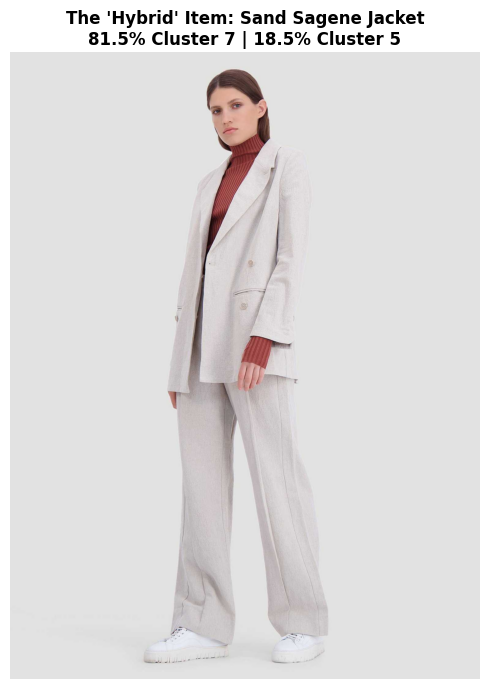

In [29]:
# Define the index found by our previous script
uncertain_idx = 14346

# Get the corresponding row from your dataframe
# Note: Use 'data_umap_gmm' or 'data' depending on which one aligns with your X_2d array
item_row = data_umap_gmm.iloc[uncertain_idx]

# Extract metadata
item_name = item_row.get("name", "Unknown Name")
item_category = item_row.get("category_name", "Unknown Category")
image_filename = str(item_row.get("picture_0", ""))

print(f"--- ITEM DETAILS ---")
print(f"Name: {item_name}")
print(f"Original Category: {item_category}")
print(f"--------------------")

# Construct the full image path and display it
img_path = os.path.join(DATA_IMAGES, image_filename)

try:
    img = Image.open(img_path)
    
    plt.figure(figsize=(5, 7))
    plt.imshow(img)
    plt.title(f"The 'Hybrid' Item: {item_name}\n81.5% Cluster 7 | 18.5% Cluster 5", fontweight="bold")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    
except Exception as e:
    print(f"Could not load image at {img_path}. Error: {e}")

Cluster 7: Trousers
Cluster 5: Jackets

Item being rented out is a jacket but trousers is also visible in picture. Thats why it makes sense that class probability is lower than in other cases.

## UMAP + HDBSCAN

Use same dimension reduction from earlier to test if get the same segments.

In [26]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=200, metric='euclidean')
labels = clusterer.fit_predict(X_reduced)

data_umap_hdbscan = data.copy()
data_umap_hdbscan["cluster"] = labels

In [27]:
print(np.unique(labels))

noise_ratio = np.mean(labels == -1)
print("Noise ratio:", noise_ratio)

pd.Series(labels).value_counts()

[-1  0  1  2  3  4  5  6  7]
Noise ratio: 0.06990862035912838


 7    5854
 3    3111
 4    2041
 5    1519
-1    1094
 2    1080
 1     421
 0     314
 6     215
Name: count, dtype: int64

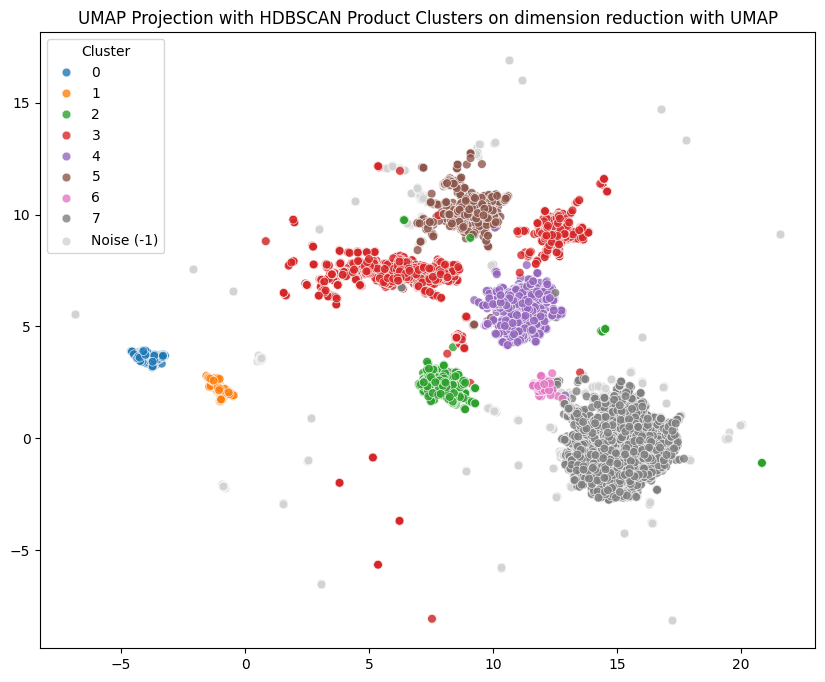

In [28]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_umap_hdbscan["cluster"], 
                   title = "UMAP Projection with HDBSCAN Product Clusters on dimension reduction with UMAP")

**Results**

Fairly similar segmentation. Continuing with KMeans clusters, because HDBSCAN classifies some products as noise so it is harder to interpret those. 

HDBSCAN fails to correctly differentiate between trousers and jackets/coats, but is able to segment jumpsuits (cluster 6) from dresses (cluster 7).

# Case 3: Dimension cutting using only the most important embedding vectors (Matryoshka Embeddings)

**Data Slicing**

The Voyage Multimodal allows us to just take the first 256 dimensions of the embeddings. The modal was build in a way that the first 256 dimensions have the most important information stored with finer more detailed info in the other dimensions. Taking the first dimensions could improve the ability of kmeans and HDBSCAN to better find clusters.

In [29]:
# Reducing dimensionality by selecting the first 256 features
X_256 = X[:, :256]
print(f"Data sliced to: {X_256.shape} instead of {X.shape}")

Data sliced to: (15649, 256) instead of (15649, 2048)


## HDBSCAN

Results are poor as expected. The method is not able to build stable clusters.

In [30]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=50, metric='euclidean')
labels = clusterer.fit_predict(X_256)

data_slicing_hdbscan = data.copy()
data_slicing_hdbscan["cluster"] = labels

In [31]:
print(np.unique(labels))

noise_ratio = np.mean(labels == -1)
print("Noise ratio:", noise_ratio)

pd.Series(labels).value_counts()

[-1  0  1]
Noise ratio: 0.03751038405009905


 0    14887
-1      587
 1      175
Name: count, dtype: int64

UMAP Projection in 2D space

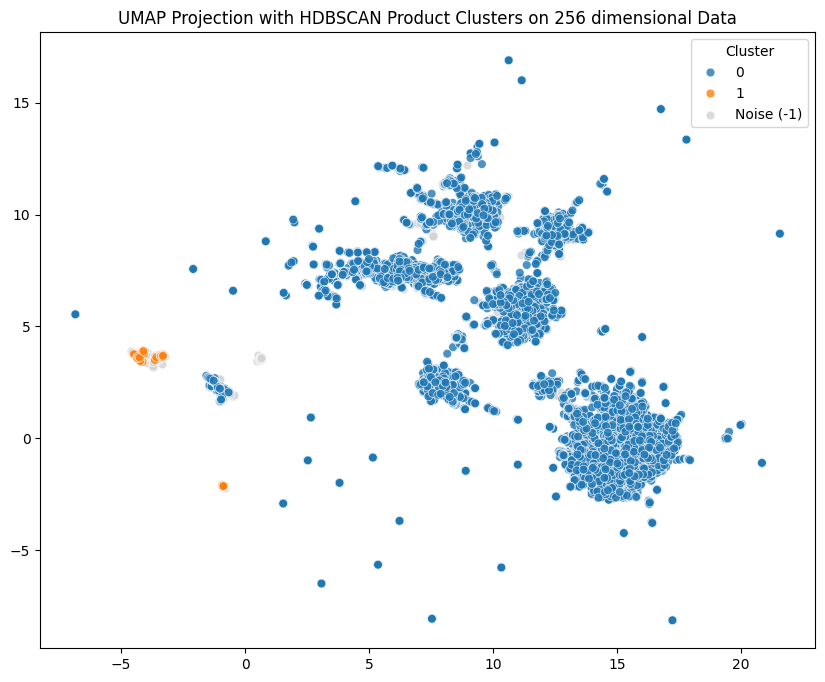

In [32]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_slicing_hdbscan["cluster"], 
                   title = "UMAP Projection with HDBSCAN Product Clusters on 256 dimensional Data")

## KMeans

**Step 1: Optimal Cluster Scan**

In [ ]:
results = []

for k in range(2, 20):
    kmeans = KMeans(n_clusters = k, random_state = 42)
    labels = kmeans.fit_predict(X_256)

    sil_score = silhouette_score(X_256, labels)

    cluster_sizes = pd.Series(labels).value_counts().sort_index()
    imbalance = cluster_sizes.std() / cluster_sizes.mean() # relative imbalance - higher means more imbalanced cluster sizes
    results.append({
        "k": k,
        "silhouette": sil_score,
        "min_cluster_size": cluster_sizes.min(),
        "max_cluster_size": cluster_sizes.max(),
        "imbalance": imbalance
    })

results_df = pd.DataFrame(results)
print(results_df)

     k  silhouette  min_cluster_size  max_cluster_size  imbalance
0    2    0.073424              6734              8915   0.197099
1    3    0.077623               925              7988   0.722492
2    4    0.082460               908              6737   0.610401
3    5    0.087737               909              6364   0.658082
4    6    0.088145               895              6326   0.729406
5    7    0.094272               897              6279   0.821569
6    8    0.069793               897              3702   0.457699
7    9    0.067958               897              2315   0.278044
8   10    0.067027               897              2089   0.240698
9   11    0.062375               726              1993   0.272309
10  12    0.062579               714              1768   0.269578
11  13    0.060311               715              1634   0.242093
12  14    0.059256               706              1633   0.239779
13  15    0.057022               244              1630   0.327788
14  16    

**Step 2: Check Cluster Stability**

In [47]:
for k in range(5, 15):
    aris = []
    for seed in range(25):
        k1 = KMeans(n_clusters=k, random_state=seed).fit(X_256)
        k2 = KMeans(n_clusters=k, random_state=seed+100).fit(X_256)

        aris.append(adjusted_rand_score(k1.labels_, k2.labels_))
    
    print(f"Mean ARI for k={k}:", np.mean(aris))

Mean ARI for k=5: 0.6412847134696925
Mean ARI for k=6: 0.6351264190750762
Mean ARI for k=7: 0.6712073635128329
Mean ARI for k=8: 0.6985857626024153
Mean ARI for k=9: 0.7390246616778637
Mean ARI for k=10: 0.7392751040131358
Mean ARI for k=11: 0.7656595315671473
Mean ARI for k=12: 0.7557098169791235
Mean ARI for k=13: 0.7297533906976063
Mean ARI for k=14: 0.7134960675678897


The optimal number of clusters was determined by jointly evaluating silhouette scores and clustering stability.

The silhouette score (0.94) peaked at k = 7, indicating the best separation between clusters.

Although k = 6 showed higher stability (ARI = 0.98), the separation between clusters was weaker a bit weaker (silhoutte = 0.88). Therefore, k = 7 was selected as the optimal balance between cluster quality and stability.

**Step 3: Final Model Fitting**

The final K-Means model was applied to the sliced dataset. This step assigns each item in the Vibrent catalog to one of the 7 strategic style groups for further analysis.

In [35]:
k = 7

kmeans = KMeans(n_clusters=k, random_state=42)

data_slicing_kmeans = data.copy()
data_slicing_kmeans["cluster"] = kmeans.fit_predict(X_256)

# Displaying the final distribution of items
print(f"Cluster distribution for K={k}:")
print(data_slicing_kmeans["cluster"].value_counts().sort_index())

Cluster distribution for K=7:
cluster
0     897
1    1148
2    2127
3    1489
4    2023
5    1686
6    6279
Name: count, dtype: int64


**Step 4: Cluster Profiling & Identity**

By analyzing the top brands and categories within each group, we identified the specific fashion identity of each cluster, ensuring the segmentation aligns with real-world inventory.

In [36]:
# We focus on the most descriptive columns: 'name' and 'Brand'
profiling_cols = ['name', 'Brand']

for i in range(7):
    print(f"\n" + "="*40)
    print(f"         ANALYSIS OF CLUSTER {i}")
    print("="*40)
    
    for col in profiling_cols:
        if col in data_slicing_kmeans.columns:
            print(f"\nTop 5 {col.upper()}:")
            print(data_slicing_kmeans[data_slicing_kmeans["cluster"] == i][col].value_counts().head(5))


         ANALYSIS OF CLUSTER 0

Top 5 NAME:
name
Golden Pink Elements Picasso Earings    8
Ark Earrings Tortoise                   8
Penny Boot Peach                        6
Malou Red                               6
Lili Gold/Silver                        6
Name: count, dtype: int64

Top 5 BRAND:
Brand
Hasla            91
SILFEN Studio    58
Chanel           50
Kaibosh          46
A/BARENESS       44
Name: count, dtype: int64

         ANALYSIS OF CLUSTER 1

Top 5 NAME:
name
Shiny Black Andorra Skirt        16
Mildred Gold Skirt               13
Yellow Basalt Skirt              12
Shiny Andorra Skirt              12
Shiny Black Grape Leaf Skirt     12
Name: count, dtype: int64

Top 5 BRAND:
Brand
FWSS               118
Mette Møller        88
Holzweiler          74
Samsøe & Samsøe     60
Urban Pioneers      38
Name: count, dtype: int64

         ANALYSIS OF CLUSTER 2

Top 5 NAME:
name
Floral Ring My Bell Top              19
Flerken Wrap Top Blue                12
Simone Jet Black Top 

**Step 5: Final Cluster Naming & Strategic Mapping**

The numerical clusters were mapped to descriptive marketing names.

In [37]:
cluster_names = {
    0: "Accessories & Jewelry",   # Earring and jewelry brands like Hasla
    1: "Modern Skirts",           # High frequency of 'Skirt' items
    2: "Blouses & Tops",          # High frequency of 'Top' and 'Shirt'
    3: "Trousers & Jumpsuits",    # Mixed bottom-heavy/full-body items
    4: "Alpine & Outerwear",      # Winter jackets and parkas (Kari Traa)
    5: "Knitwear & Scarves",      # Sweaters and scarves
    6: "Boutique Dresses"         # High-end dresses (byTiMo, Reformation)
}

data_slicing_kmeans["cluster_name"] = data_slicing_kmeans["cluster"].map(cluster_names)

# Final validation
print("Final Strategic Segmentation for Vibrent:")
print(data_slicing_kmeans["cluster_name"].value_counts())

Final Strategic Segmentation for Vibrent:
cluster_name
Boutique Dresses         6279
Blouses & Tops           2127
Alpine & Outerwear       2023
Knitwear & Scarves       1686
Trousers & Jumpsuits     1489
Modern Skirts            1148
Accessories & Jewelry     897
Name: count, dtype: int64


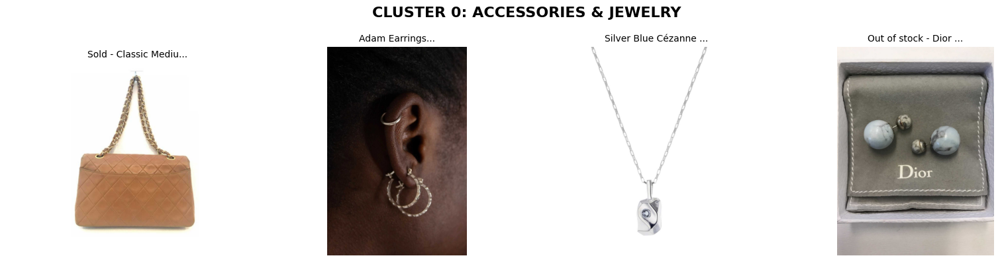

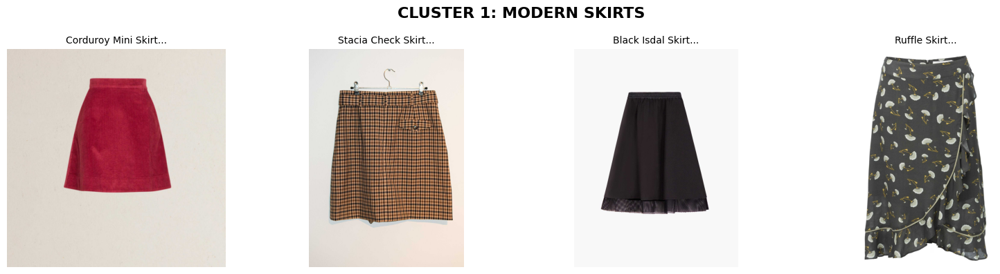

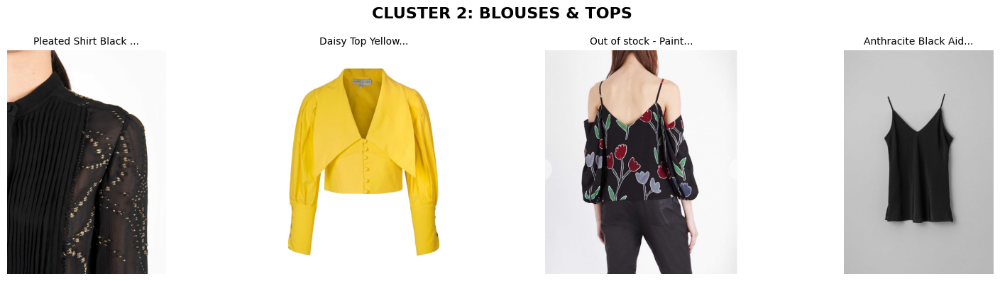

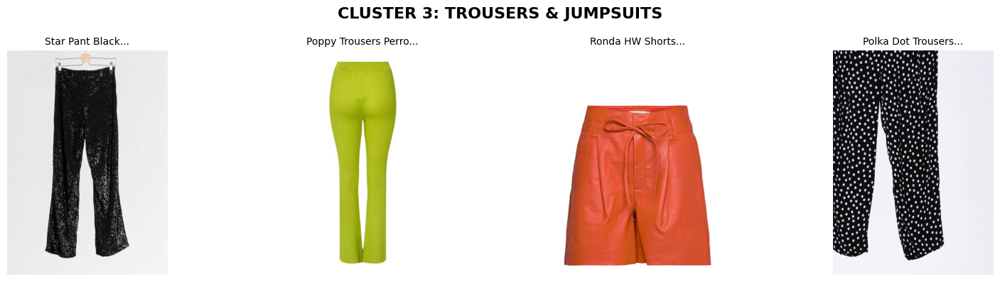

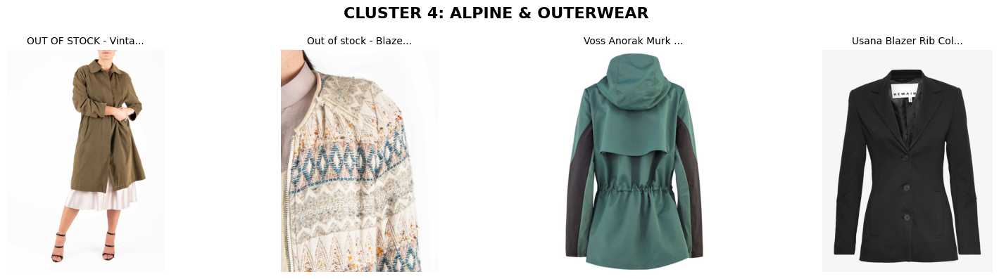

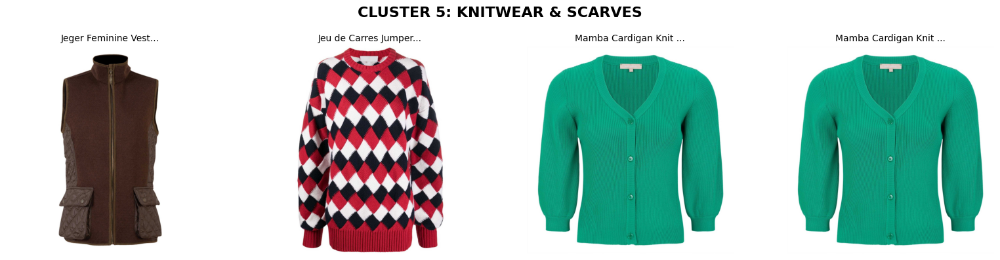

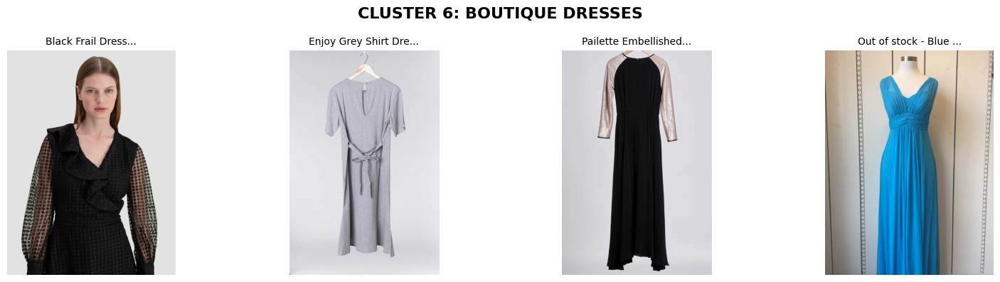

In [ ]:
verify_cluster_labels(data_slicing_kmeans, DATA_IMAGES, cluster_names)

**Step 6: Marketing Visualization with UMAP**

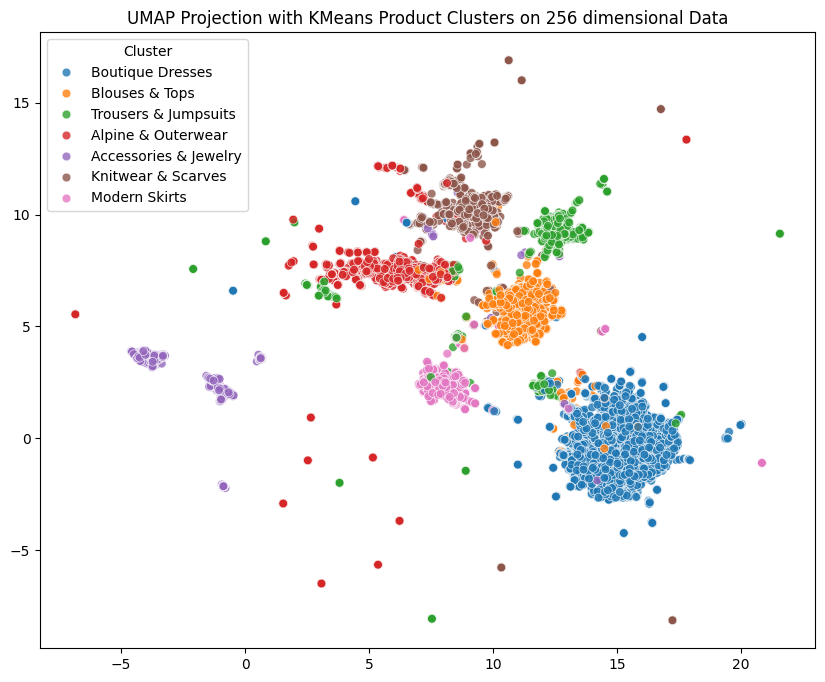

In [39]:
plot_2d_projection(X_2d = X_2d, # Use 2D UMAP projection for visualization
                   labels = data_slicing_kmeans["cluster_name"], 
                   title = "UMAP Projection with KMeans Product Clusters on 256 dimensional Data")

# Final Conclusion & Model Selection

After conducting extensive experiments on the Voyage AI multimodal embeddings, we have established a robust and semantically meaningful product segmentation strategy. Here is a summary of our findings and the justification for our final pipeline:

**1. Dimensionality Reduction (UMAP):**
We confirmed that clustering directly on high-dimensional embeddings suffers from the curse of dimensionality. By performing a grid search, we identified that reducing the space to **20 dimensions** using UMAP provides the optimal balance. It retains the complex semantic relationships of the fashion items while creating a dense enough space for distance-based clustering to perform excellently.

**2. Model Selection (K-Means vs. GMM vs. HDBSCAN):**
* **HDBSCAN** was discarded because, while great at finding arbitrary shapes, it tends to classify a significant portion of the catalog as "noise" (-1). For our business use case (assortment profiling and churn prediction), we need every item assigned to a valid category.
* **Gaussian Mixture Models (GMM)** allowed us to explore soft clustering. We found a few "hybrid" items (e.g., a coat that is 81% winter outerwear and 19% sporty activewear), proving that our embeddings truly understand stylistic nuances. However, UMAP separates the data into such distinct "islands" that >99% of items have a near 100% probability of belonging to a single cluster. 
* **Conclusion:** Because the UMAP projection provides such clear-cut separation, the probabilistic approach of GMM offers no significant operational advantage over the simpler, faster, and more interpretable **K-Means**.

**3. The Optimal $k$ (k=8):**
Using the Silhouette Score and validating stability with the Adjusted Rand Index (ARI), we mathematically determined that **$k=8$ clusters** represent the most natural grouping of our inventory. 

**Next Steps:**
We have successfully decoded the product landscape into 8 robust, data-driven "Style Clusters" and implemented an automated naming convention based on the most frequent original tags. We will now transition to **Notebook 2**, where we will use these clusters to profile customer behavior and build a predictive Churn Model.